# MLFlow Tutorial
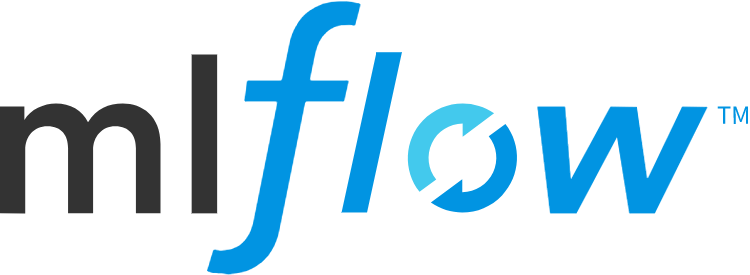

In [ ]:
#install MLflow
!pip install mlflow  pytorch_lightning --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 37.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 39.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.6/147.6 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

In [ ]:
import mlflow

In [ ]:
from IPython.core.magic import register_line_magic
import IPython
import subprocess

#write juopyter inline function to show website in iframe
@register_line_magic
def run_mlflow_server(line):
    handle = IPython.display.display(
            IPython.display.Pretty("Launching my server..."),
            display_id=True,
    )
    subprocess.Popen(['mlflow', 'ui', '--port', '50000'])
    shell = """
        (async () => {
            const url = new URL(await google.colab.kernel.proxyPort(50000, {'cache': true}));
            const iframe = document.createElement('iframe');
            iframe.src = url;
            iframe.setAttribute('width', '100%');
            iframe.setAttribute('height', '750');
            iframe.setAttribute('frameborder', 0);
            document.body.appendChild(iframe);
        })();
    """
    script = IPython.display.Javascript(shell)
    handle.update(script)

In [ ]:
%run_mlflow_server

<IPython.core.display.Javascript object>

## A simple Scikit-Learn Example

See MLFlow Sk-Learn API: https://mlflow.org/docs/2.11.3/python_api/mlflow.sklearn.html

In [ ]:
#get Iris tpoy dataset
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

data = load_iris()
X, y = data.data, data.target

X_train, X_test, y_train, y_test = train_test_split(X, y)


In [ ]:
#train Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

#set mlflow server
mlflow.set_tracking_uri("http://localhost:50000")
current_run = mlflow.start_run()
#start run will auto log many paramters from sk-model

for estimators in [1,2,5,10,20,50,100]:

  #Model definition.
  rclf = RandomForestClassifier(n_estimators = estimators, max_depth=2)

  mlflow.sklearn.autolog()
  rclf.fit(X_train, y_train)

  #train error
  pred_train = rclf.predict(X_train)
  mlflow.log_param("train acc", accuracy_score(pred_train, y_train))

  # test error
  pred_test = rclf.predict(X_test)
  mlflow.log_param("test acc", accuracy_score(pred_test, y_test))

  mlflow.end_run()

2024/04/01 14:09:23 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '893bf11a28404c72939cf6445ffb7641', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024/04/01 14:09:26 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '7d08540719404ee0a398e92ff7501a74', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024/04/01 14:09:29 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '3f534725a70f4fbca8e6192547df16d6', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024/04/01 14:09:35 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'f7181b0fe7b64eb8bd82f7af6e9f3562', which will track hyperparameters, performance metrics, model artifacts, and lineage i

## Exercise 1:
* exend the RF experiment above to a search over at least two parameters and generate plots in MLFlow to find the best model!

## Pytorch
* API Docu: https://mlflow.org/docs/latest/python_api/mlflow.pytorch.html

In [ ]:
mlflow.set_experiment('Pytorch-101')          # set the experiment name
mlflow.pytorch.autolog()

2024/04/01 14:15:47 INFO mlflow.tracking.fluent: Experiment with name 'Pytorch-101' does not exist. Creating a new experiment.
2024/04/01 14:15:57 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of pytorch. If you encounter errors during autologging, try upgrading / downgrading pytorch to a supported version, or try upgrading MLflow.


In [ ]:
import os

import pytorch_lightning as pl
import torch
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import MNIST

#try:
from torchmetrics.functional import accuracy
#except ImportError:
#    from pytorch_lightning.metrics.functional import accuracy

import mlflow.pytorch
from mlflow import MlflowClient

# For brevity, here is the simplest most minimal example with just a training
# loop step, (no validation, no testing). It illustrates how you can use MLflow
# to auto log parameters, metrics, and models.


class MNISTModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.l1 = torch.nn.Linear(28 * 28, 10)

    def forward(self, x):
        return torch.relu(self.l1(x.view(x.size(0), -1)))

    def training_step(self, batch, batch_nb):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        pred = logits.argmax(dim=1)
        acc = accuracy(pred, y, task="multiclass", num_classes=10)

        # Use the current of PyTorch logger
        self.log("train_loss", loss, on_epoch=True)
        self.log("acc", acc, on_epoch=True)
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.02)


def print_auto_logged_info(r):
    tags = {k: v for k, v in r.data.tags.items() if not k.startswith("mlflow.")}
    artifacts = [f.path for f in MlflowClient().list_artifacts(r.info.run_id, "model")]
    print("run_id: {}".format(r.info.run_id))
    print("artifacts: {}".format(artifacts))
    print("params: {}".format(r.data.params))
    print("metrics: {}".format(r.data.metrics))
    print("tags: {}".format(tags))


# Initialize our model
mnist_model = MNISTModel()

# Initialize DataLoader from MNIST Dataset
train_ds = MNIST(
    os.getcwd(), train=True, download=True, transform=transforms.ToTensor()
)
train_loader = DataLoader(train_ds, batch_size=32)

# Initialize a trainer
trainer = pl.Trainer(max_epochs=10)

# Auto log all MLflow entities
mlflow.pytorch.autolog()

# Train the model
with mlflow.start_run() as run:
    trainer.fit(mnist_model, train_loader)

# fetch the auto logged parameters and metrics
print_auto_logged_info(mlflow.get_run(run_id=run.info.run_id))


100%|██████████| 9912422/9912422 [00:00<00:00, 111315904.83it/s]


Extracting /content/MNIST/raw/train-images-idx3-ubyte.gz to /content/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 80010365.80it/s]


Extracting /content/MNIST/raw/train-labels-idx1-ubyte.gz to /content/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 32161252.41it/s]


Extracting /content/MNIST/raw/t10k-images-idx3-ubyte.gz to /content/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 15252625.11it/s]


Extracting /content/MNIST/raw/t10k-labels-idx1-ubyte.gz to /content/MNIST/raw



INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
2024/04/01 14:16:08 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of pytorch. If you encounter errors during autologging, try upgrading / downgrading pytorch to a supported version, or try upgrading MLflow.
2024/04/01 14:16:08 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/mlflow/pytorch/_lightning_autolog.py:463: UserWarning: Autologging is known to be compatible with pytorch-lightning versions between 1.4.9 and 2.2.0.post0 and may not succeed with packages outside this range."
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type   | Params
---------------

Training: |          | 0/? [00:00<?, ?it/s]

2024/04/01 14:16:40 WARNING mlflow.utils.checkpoint_utils: Checkpoint logging is skipped, because checkpoint 'save_best_only' config is True, it requires to compare the monitored metric value, but the provided monitored metric value is not available.
2024/04/01 14:17:11 WARNING mlflow.utils.checkpoint_utils: Checkpoint logging is skipped, because checkpoint 'save_best_only' config is True, it requires to compare the monitored metric value, but the provided monitored metric value is not available.
2024/04/01 14:17:42 WARNING mlflow.utils.checkpoint_utils: Checkpoint logging is skipped, because checkpoint 'save_best_only' config is True, it requires to compare the monitored metric value, but the provided monitored metric value is not available.
2024/04/01 14:18:13 WARNING mlflow.utils.checkpoint_utils: Checkpoint logging is skipped, because checkpoint 'save_best_only' config is True, it requires to compare the monitored metric value, but the provided monitored metric value is not availab

## Exercise 2:
* Extend the very basic NN above
* try to reach optimal test loss
* log all experiments
* generate plots to find the best model and hyperparameters